## Advanced Lane Finding Project

The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

---
## First, I'll compute the camera calibration using chessboard images

In [1]:
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
%matplotlib inline
#%matplotlib qt

# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# Make a list of calibration images
images = glob.glob('../camera_cal/calibration*.jpg')

# Step through the list and search for chessboard corners
for fname in images:
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
    #print(np.shape(img))
    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (9,6),None)
    
    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)

        img = cv2.drawChessboardCorners(img, (9,6), corners, ret)
        #RGB_image = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        #plt.figure()
        #plt.imshow(RGB_image)


## Validating the camera calibration function

dist_coef [[-0.24688507 -0.02373155 -0.00109831  0.00035107 -0.00259868]]
the destination is../camera_cal/calibration19.jpg0
the destination is../camera_cal/calibration16.jpg1
the destination is../camera_cal/calibration14.jpg2
the destination is../camera_cal/calibration20.jpg3
the destination is../camera_cal/calibration12.jpg4
the destination is../camera_cal/calibration11.jpg5
the destination is../camera_cal/calibration18.jpg6
the destination is../camera_cal/calibration3.jpg7
the destination is../camera_cal/calibration8.jpg8
the destination is../camera_cal/calibration6.jpg10


/opt/conda/lib/python3.6/site-packages/matplotlib/pyplot.py:523: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


the destination is../camera_cal/calibration17.jpg11
the destination is../camera_cal/calibration7.jpg12
the destination is../camera_cal/calibration13.jpg13
the destination is../camera_cal/calibration9.jpg15
the destination is../camera_cal/calibration15.jpg16
the destination is../camera_cal/calibration10.jpg19


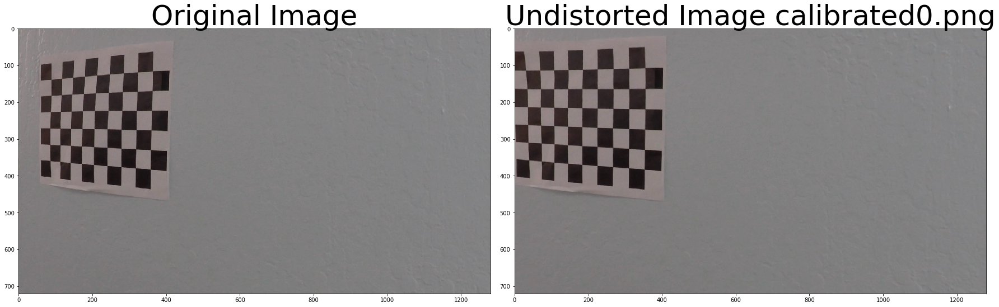

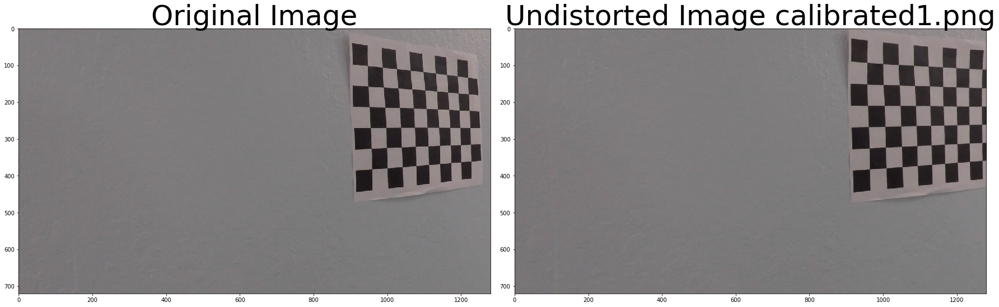

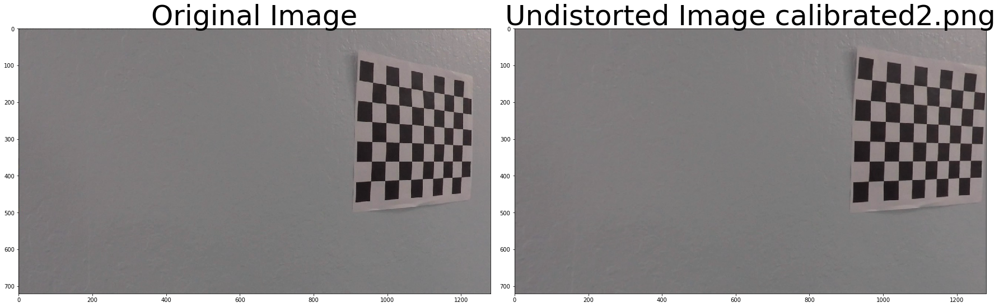

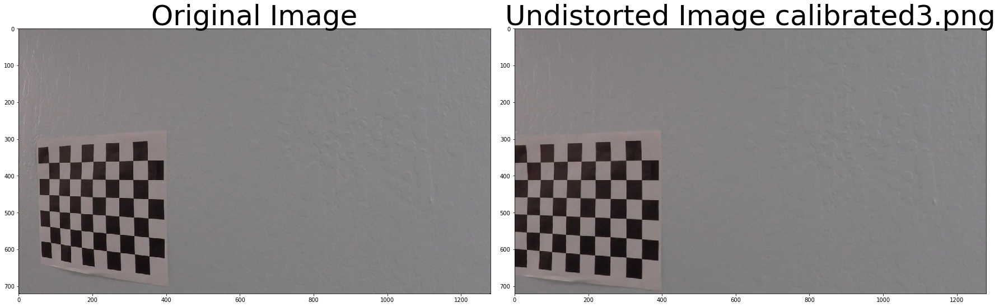

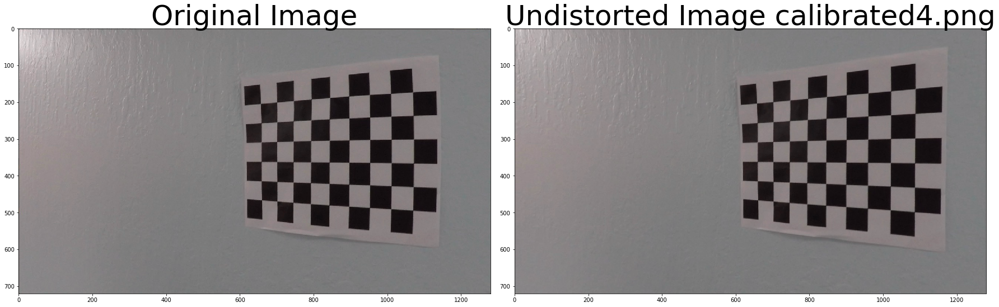

...

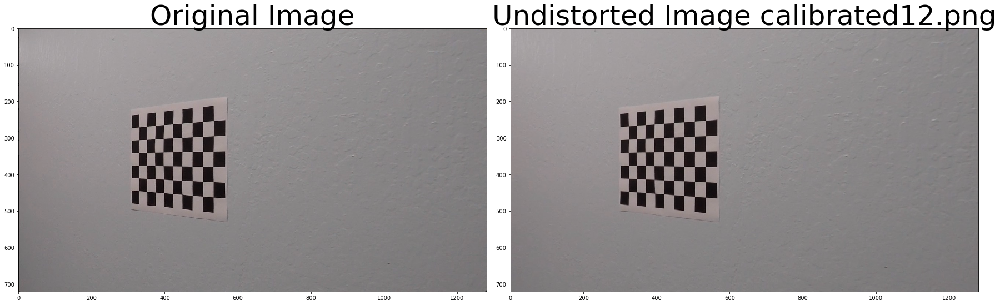

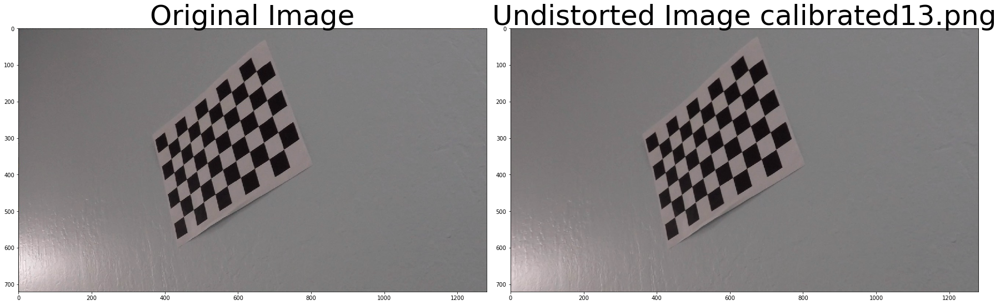

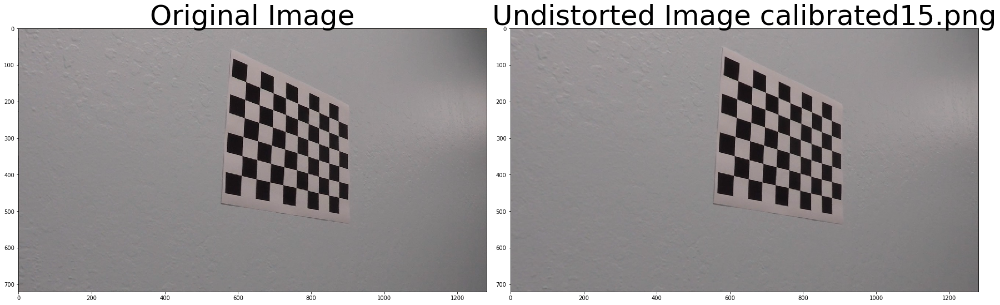

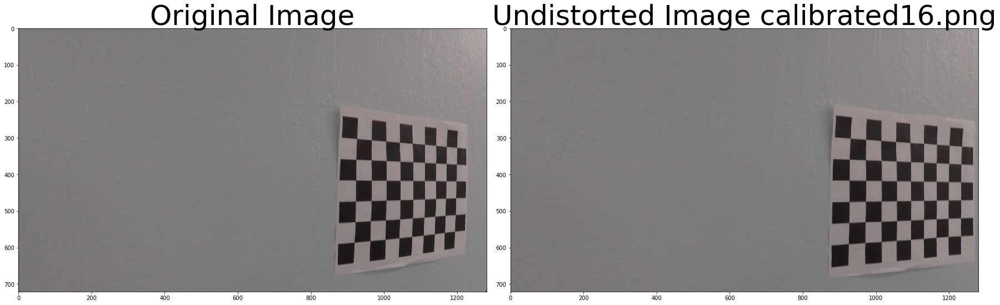

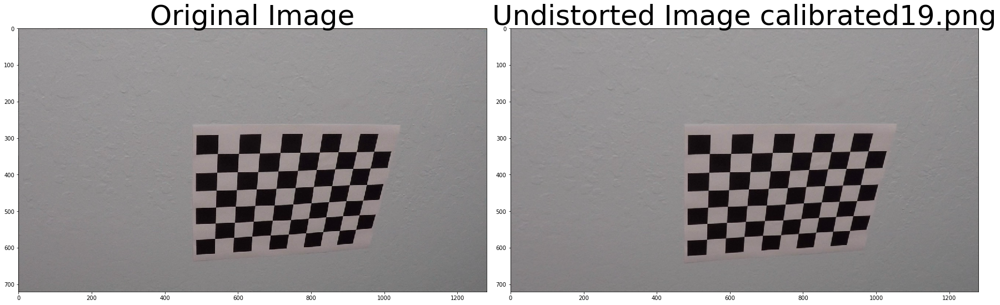

In [2]:
(h,w)=np.shape(gray)
nx=9
ny=6


ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, (w,h),None,None)
dst_points=np.float32([[int(w/10),int(h/10)],[int(9*w/10),int(h/10)],[int(w/10),int(9*h/10)],[int(9*w/10),int(9*h/10)]])
print('dist_coef',dist)
contador=0
for fname in images:
    img = cv2.imread(fname)
    undist = cv2.undistort(img, mtx, dist,None,mtx)
    gray = cv2.cvtColor(undist,cv2.COLOR_BGR2GRAY)
    #cv2.imwrite('../calibrated_chessboard/calibrated%i.png'%contador,undist)
    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (nx,ny),None)
    if ret:
        src=np.float32([corners[0][0],corners[nx-1][0],corners[(nx)*(ny-1)][0],corners[nx*ny -1][0]])

        #print(src.shape)
        #print(dst.shape)
        M = cv2.getPerspectiveTransform(src, dst_points)
        warped = cv2.warpPerspective(undist, M, (w,h), flags=cv2.INTER_LINEAR)
        warped_inicial = cv2.warpPerspective(img, M, (w,h), flags=cv2.INTER_LINEAR)
        plt.figure()
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
        f.tight_layout()
        #ax1.imshow(warped_inicial)
        ax1.imshow(img)
        print('the destination is'+fname+str(contador))
        ax1.set_title('Original Image', fontsize=50)
        #ax2.imshow(warped)
        ax2.imshow(undist)
        ax2.set_title('Undistorted Image calibrated%i.png'%contador, fontsize=50)
        plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    contador+=1
  

## Binary threshold of the image to conserve the lines

In [3]:
def pipeline(img, s_thresh=(170, 255), sx_thresh=(20, 100),r_thresh = (200, 255),thresh_h = (15, 100)):
    img = np.copy(img)
    R = img[:,:,2]

    
    binary_R = np.zeros_like(R)
    binary_R[(R > r_thresh[0]) & (R <= r_thresh[1])] = 255
    # Convert to HLS color space and separate the V channel
    hls = cv2.cvtColor(img, cv2.COLOR_BGR2HLS)
    h_channel = hls[:,:,0]
    l_channel = hls[:,:,1]
    s_channel = hls[:,:,2]
    # Sobel x
    sobelx = cv2.Sobel(l_channel, cv2.CV_64F, 1, 0) # Take the derivative in x
    abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))
    
    # Threshold x gradient
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= sx_thresh[0]) & (scaled_sobel <= sx_thresh[1])] = 255
    
    # Threshold color channel
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= s_thresh[0]) & (s_channel <= s_thresh[1])] = 255
    
    
    h_binary = np.zeros_like(h_channel)
    h_binary[(h_channel > thresh_h[0]) & (h_channel <= thresh_h[1])] = 255
    # Stack each channel
    combined = np.zeros_like(s_binary)
    combined[ (s_binary == 255)  | (sxbinary == 255) | ((h_binary == 255) & (binary_R ==255))]= 255
    return combined
    


Trying the gradient and color thresholds together

../test_images/test3.jpg
../test_images/test5.jpg
../test_images/test1.jpg
../test_images/test2.jpg
../test_images/test6.jpg
../test_images/test4.jpg


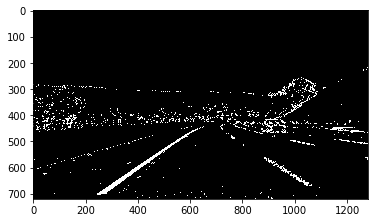

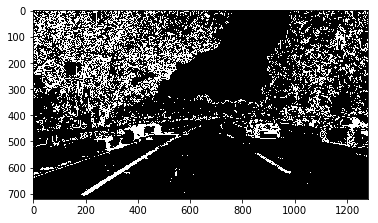

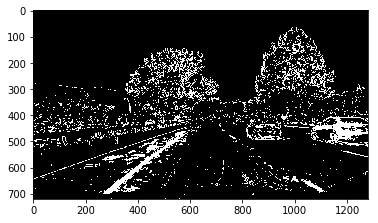

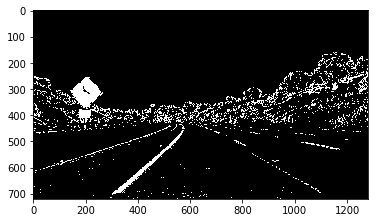

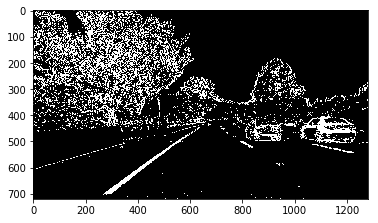

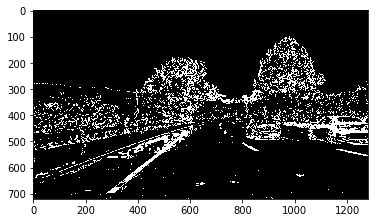

In [4]:
images = glob.glob('../test_images/test*.jpg')

# Step through the list and search for chessboard corners
for fname in images:
    img = cv2.imread(fname)
    undist = cv2.undistort(img, mtx, dist,None,mtx)
    #cv2.imwrite('../undist_test_images/undist%s.png'%fname[-5],undist)
    print(fname)
    thresholded_image=pipeline(undist)
    #cv2.imwrite('../thresholded_images/thresholded%s.png'%fname[-5],thresholded_image)
    gray = cv2.cvtColor(undist,cv2.COLOR_BGR2GRAY)
    plt.figure()
    plt.imshow(thresholded_image,cmap='gray')
    

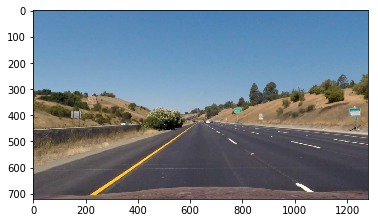

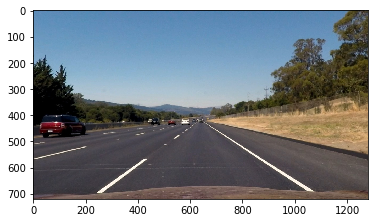

In [5]:
images = glob.glob('../test_images/straight_lines*.jpg')

# Step through the list and search for chessboard corners
for fname in images:
    img = cv2.imread(fname)
    undist = cv2.undistort(img, mtx, dist,None,mtx)
    plt.figure()
    RGB_image = cv2.cvtColor(undist, cv2.COLOR_BGR2RGB)
    plt.imshow(RGB_image)

## Applying the warp perspective

In [6]:
### defining the porcentages for the trapezoidal region 
bottom_y_percentage=0.935
top_y_percentage=0.62
width_x_top=0.06
width_x_bottom=0.60


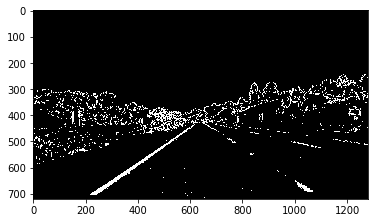

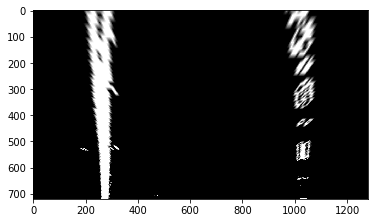

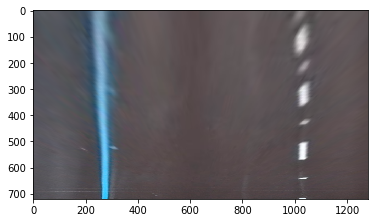

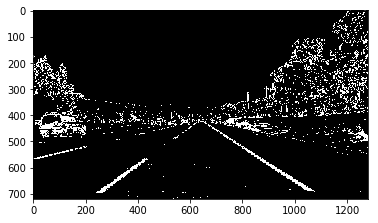

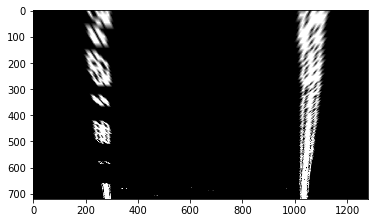

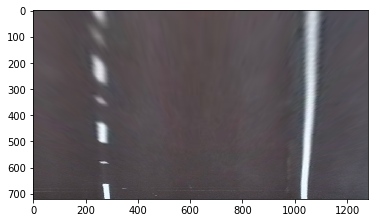

In [7]:
(h,w)=np.shape(gray)
offset=0.2*w
src_points= np.float32([[w*(0.5-width_x_bottom/2),bottom_y_percentage*h],[w*(0.5+width_x_bottom/2),bottom_y_percentage*h],[w*(0.5+width_x_top/2),top_y_percentage*h],[w*(0.5-width_x_top/2),top_y_percentage*h]])
dst_points= np.float32([[offset,h],[w-offset,h],[w-offset,0],[offset,0]])
transform_matrix = cv2.getPerspectiveTransform(src_points, dst_points)

images = glob.glob('../test_images/straight_lines*.jpg')

# Step through the list and search for chessboard corners
contador=0
for fname in images:
    img = cv2.imread(fname)
    undist = cv2.undistort(img, mtx, dist,None,mtx)
    thresholded=pipeline(undist)
    plt.figure()
    plt.imshow(thresholded,cmap='gray')
    warped = cv2.warpPerspective(thresholded, transform_matrix, (w,h), flags=cv2.INTER_LINEAR)
    warped_init = cv2.warpPerspective(undist, transform_matrix, (w,h), flags=cv2.INTER_LINEAR)
    #cv2.imwrite('../warped_straight/straight_undist%i.png'%contador,thresholded)
    #cv2.imwrite('../warped_straight/straight_warped%i.png'%contador,warped)
    contador +=1
    
    plt.figure()
    plt.imshow(warped,cmap='gray')
    plt.figure()
    plt.imshow(warped_init)

        

## Trying the warp in all the test_images

../test_images/test3.jpg
../test_images/test5.jpg
../test_images/test1.jpg
../test_images/test2.jpg
../test_images/test6.jpg


/opt/conda/lib/python3.6/site-packages/matplotlib/pyplot.py:523: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


../test_images/test4.jpg


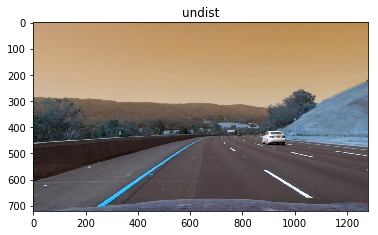

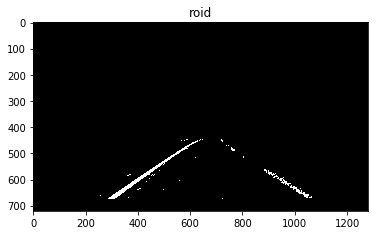

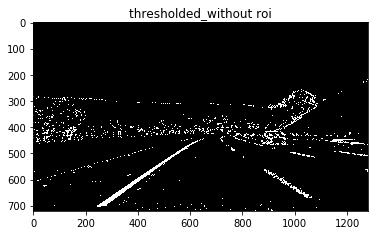

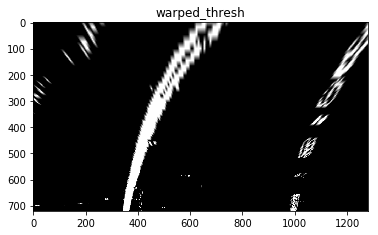

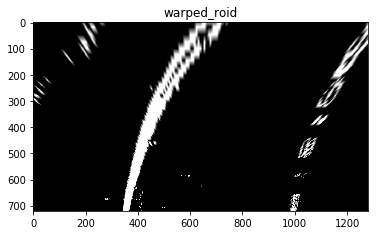

...

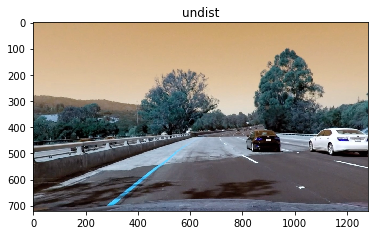

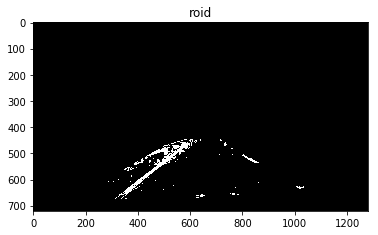

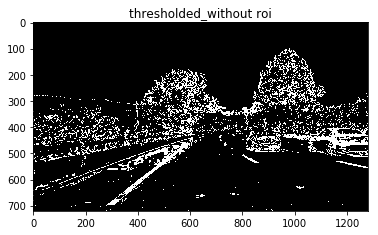

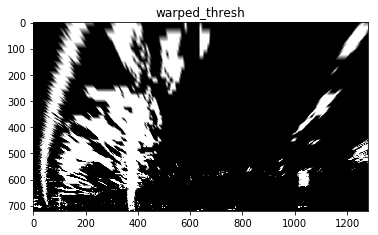

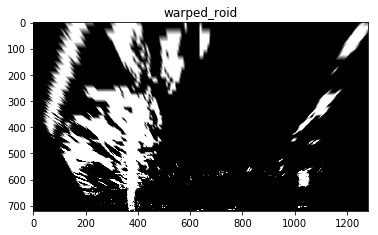

In [8]:
def region_of_interest(img, vertices):
    """
    Applies an image mask.
    Only keeps the region of the image defined by the polygon
    formed from `vertices`. The rest of the image is set to black.
    """
    #defining a blank mask to start with
    mask = np.zeros_like(img)

    ignore_mask_color = 255

    #filling pixels inside the polygon defined by "vertices" with the fill color
    cv2.fillPoly(mask, vertices, ignore_mask_color)

    #returning the image only where mask pixels are nonzero
    masked_image = cv2.bitwise_and(img, mask)
    return masked_image

(h,w)=np.shape(gray)
offset=0.25*w
src_points= np.float32([[w*(0.5-width_x_bottom/2),bottom_y_percentage*h],[w*(0.5+width_x_bottom/2),bottom_y_percentage*h],[w*(0.5+width_x_top/2),top_y_percentage*h],[w*(0.5-width_x_top/2),top_y_percentage*h]])
# defining vertices
top_width_roi=0.15
width_roi_bottom=0.76
vertices= np.int32([[[w*(0.5-width_roi_bottom/2),bottom_y_percentage*h],[w*(0.5+width_roi_bottom/2),bottom_y_percentage*h],[w*(0.5+top_width_roi/2),top_y_percentage*h],[w*(0.5-top_width_roi/2),top_y_percentage*h]]])
dst_points= np.float32([[offset,h],[w-offset,h],[w-offset,0],[offset,0]])

transform_matrix = cv2.getPerspectiveTransform(src_points, dst_points)

images = glob.glob('../test_images/test*.jpg')

# Step through the list and search for chessboard corners
cont=0
for fname in images:
    print(fname)
    img = cv2.imread(fname)
    undist = cv2.undistort(img, mtx, dist,None,mtx)
    #cv2.drawContours(undist, vertices, -1, (0,255,0), 5)
    #cv2.drawContours(undist, src_points_src, -1, (0,255,0), 2)
    #cv2.drawContours(undist, src_points_src2, -1, (255,0,0), 2)

    plt.figure()
    plt.imshow(undist)
    plt.title('undist')
    thresholded=pipeline(undist)
    roid=region_of_interest(thresholded, vertices)
    plt.figure()
    plt.imshow(roid,cmap='gray')
    plt.title('roid')
    plt.figure()
    plt.imshow(thresholded,cmap='gray')
    plt.title('thresholded_without roi')

    warped = cv2.warpPerspective(thresholded, transform_matrix, (w,h), flags=cv2.INTER_LINEAR)
    plt.figure()
    plt.imshow(warped,cmap='gray')
    plt.title('warped_thresh')

    warped_roid = cv2.warpPerspective(roid, transform_matrix, (w,h), flags=cv2.INTER_LINEAR)
    plt.figure()
    plt.imshow(warped_roid,cmap='gray')
    plt.title('warped_roid')
    warped_roid.dtype='uint8'
    warped_roid[warped_roid>0]=1
    """
    Saving the images in the folder
    """
    #cv2.imwrite('../test_images/warped_roi/warped%i.png'%cont,warped_roid)
    cont+=1
    warped_init = cv2.warpPerspective(undist, transform_matrix, (w,h), flags=cv2.INTER_LINEAR)
    #plt.figure()
    #plt.imshow(warped_init)
    #plt.title('warped_init')




# Definition of  the finding lane functions

In [9]:
def find_lane_pixels(binary_warped):
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    # Create an output image to draw on and visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    
    midpoint = np.int(histogram.shape[0]//2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # HYPERPARAMETERS
    # Choose the number of sliding windows
    nwindows = 9
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50

    # Set height of windows - based on nwindows above and image shape
    window_height = np.int(binary_warped.shape[0]//nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    #print(binary_warped[0],binary_warped.shape)
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    #print('nonzeros',np.max(nonzerox),np.max(nonzeroy))
    #print(nonzero,nonzeroy.shape)

    # Current positions to be updated later for each window in nwindows
    leftx_current = leftx_base
    rightx_current = rightx_base

    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    #for window in range(nwindows):
    ## to avoid upper error
    for window in range(nwindows-0):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        ### TO-DO: Find the four below boundaries of the window ###
        win_xleft_low = leftx_current-margin  # Update this
        win_xleft_high = leftx_current+margin  # Update this
        win_xright_low = rightx_current-margin  # Update this
        win_xright_high = rightx_current+margin  # Update this
        
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),
        (win_xleft_high,win_y_high),(0,0,255), 5) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),
        (win_xright_high,win_y_high),(0,255,0), 5) 
        #print('window',(win_xleft_low,win_y_low),(win_xleft_high,win_y_high))
         #top-left corner and bottom-right
        ### TO-DO: Identify the nonzero pixels in x and y within the window ###
        #good_left_inds = binary_warped[win_y_low:win_y_high,win_xleft_low:win_xleft_high].nonzero()
        #good_right_inds = binary_warped[win_y_low:win_y_high,win_xright_low:win_xright_high].nonzero()

        good_left_inds= ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) &
        (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) &
        (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        #If you found > minpix pixels, recenter next window ###
        if len(good_left_inds)>minpix:
            leftx_current=int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds)>minpix:
            rightx_current=int(np.mean(nonzerox[good_right_inds]))
            
        
        
        ### (`right` or `leftx_current`) on their mean position ###
    # Concatenate the arrays of indices (previously was a list of lists of pixels)
    try:
        left_lane_inds = np.concatenate(left_lane_inds)
        right_lane_inds = np.concatenate(right_lane_inds)
    except:
        pass
    #except ValueError:
        # Avoids an error if the above is not implemented fully
     #   pass

    # Extract left and right line pixel positions

    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    return leftx, lefty, rightx, righty, out_img


def fit_polynomial(binary_warped,ym_per_pix = 30/720,xm_per_pix = 3.7/700): # meters per pixel in y dimension # meters per pixel in x dimension):
    # Find our lane pixels first
    leftx, lefty, rightx, righty, out_img = find_lane_pixels(binary_warped)
    weight_left=len(leftx)
    weight_right=len(rightx)
    #print('maxvalues',np.max(leftx),np.max(lefty))
    #print('maxvalues',np.max(rightx),np.max(righty))
    ### TO-DO: Fit a second order polynomial to each using `np.polyfit` ###
    left_fit = np.polyfit(lefty,leftx , 2)
    right_fit = np.polyfit( righty,rightx, 2)

    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    try:
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    except TypeError:
        # Avoids an error if `left` and `right_fit` are still none or incorrect
        print('The function failed to fit a line!')
        left_fitx = 1*ploty**2 + 1*ploty
        right_fitx = 1*ploty**2 + 1*ploty

    ## Visualization ##
    # Colors in the left and right lane regions
    out_img[lefty, leftx] = [255, 0, 0]
    out_img[righty, rightx] = [0, 0, 255]

    # Plots the left and right polynomials on the lane lines
   # plt.figure()
    #plt.imshow(out_img)
    #plt.plot(left_fitx, ploty, color='yellow')
    #plt.plot(right_fitx, ploty, color='yellow')
    #plt.savefig('../sliding_window/sliding.png')
    
    return out_img,left_fit,right_fit,weight_left,weight_right,left_fitx,right_fitx,ploty



# Defining the line class to track the lane lines

In [10]:
# Define a class to receive the characteristics of each line detection
class Line():
    weights=[0,0]
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
    #
    # how near could the lines be
    lines_offset=0.5
    def __init__(self):
        self.cont_bad=0
        # size of the window
        self.ysize=720
        # size of the window
        self.xsize=1280
        # 
        self.road_width=self.xm_per_pix*self.xsize
        # was the line detected in the last iteration?
        self.detected = False 
        # was averaged the frame
        self.averaged = False
        # x values of the last
        self.recent_xfitted = [] 
        #average x values of the fitted line over the last n iterations
        self.recent_polynomials=[]
        # recent pixels polynomials
        self.pixels_polynomial=[]
        # 
        self.bestx = None     
        #polynomial coefficients averaged over the last n iterations
        self.best_fit = None  
        #polynomial coefficients for the most recent fit
        self.current_fit = np.array([0,0,0], dtype='float') 
        #radius of curvature of the line in some units
        self.radius_of_curvature = None 
        #distance in meters of vehicle center from the line
        self.line_base_pos = None 
        #difference in fit coefficients between last and new fits
        self.diffs = np.array([0,0,0], dtype='float') 
        #x values for detected line pixels
        self.allx = None  
        #x values for the averaged lines
        self.averaged_x =None
        #x 
        self.median_x=None
        #y values for detected line pixels
        self.ally = None  
    def line_check(self,polynomial):
        self.update_line(polynomial)
        
        pass
    def update_line(self,converted_polynomial,new_curvature,ploty,plotx,pixel_polynomials):
        self.diffs=converted_polynomial-self.current_fit
        self.current_fit=converted_polynomial
        self.radius_of_curvature = new_curvature
        self.detected=True
        self.allx=plotx
        self.ally=ploty
        self.recent_polynomials.append(converted_polynomial)
        self.pixels_polynomial.append(pixel_polynomials)
        self.recent_xfitted=plotx
        self.cont_bad=0
        self.average_last_n()
    def bad_line(self):
        self.cont_bad+=1
        self.detected = False 
        if self.cont_bad>=10:
            self.averaged=False
            print('alerttttt too much bad lines')
        ## comprobar si la linea es correcta
    def calculate_curvature_and_position_and_newPoli(self,polynomial):
        y_eval=self.ysize*self.ym_per_pix
        Am=polynomial[0]*self.xm_per_pix/self.ym_per_pix**2
        Bm=polynomial[1]*self.xm_per_pix/self.ym_per_pix
        Cm=polynomial[2]*self.xm_per_pix
        newPoli=np.float32([[Am,Bm,Cm]])
        curvature = (1+(2*Am*y_eval+Bm)**2)**(3/2)/np.abs(2*Am) 
        position=Am * (y_eval**2)+Bm*y_eval+Cm
        return curvature,position,newPoli
    def check_lines_position(self,left_line_pos,right_line_pos):
        # it returns true if the lines are right
        lines_distance=right_line_pos-left_line_pos
        ## first condition means:
            # si están a menos del 35 porciento del ancho de la visión de la cámara en la vida real o mas del 80%
        ## second means:
            # if the lines are not in the half that they belongs to
        half_x=self.xsize*self.xm_per_pix/2.0
        if (lines_distance< self.road_width*0.35 or lines_distance> self.road_width*0.8) or (half_x<left_line_pos or half_x>right_line_pos) : 
            return False
        else:
            return True
    def average_last_n(self,n=10):
        if len(self.pixels_polynomial)>n:
            averaged_poly=np.mean(self.pixels_polynomial[-n:],axis=0)
            median_poly = np.median(self.pixels_polynomial[-n:],axis=0)

            self.averaged=True
            self.averaged_x = averaged_poly[0]*self.ally**2 + averaged_poly[1]*self.ally + averaged_poly[2]
            self.median_x = median_poly[0]*self.ally**2 + median_poly[1]*self.ally + median_poly[2]
    def get_position_delta(self,l_pos,r_pos):
        half_x=self.xsize*self.xm_per_pix/2.0
        return ((l_pos+r_pos)/2.0)-half_x
        

        # if there are more than n polynomials it averages the last 
        
        

left pos : 1.908711  and left curvature: 2420.777452
right pos : 5.318292  and right curvature: 1376.030814
line checked= True
[array([  6.79848199e-05,  -3.94720931e-01,   6.10063135e+02])]
the length of the array 1
the mean [  6.79848199e-05  -3.94720931e-01   6.10063135e+02]
left pos : 1.850465  and left curvature: 1180.353211
right pos : 5.213085  and right curvature: 542.887428
line checked= True
[array([  6.79848199e-05,  -3.94720931e-01,   6.10063135e+02]), array([ -1.39133645e-04,   1.94912636e-01,   2.81877673e+02])]
the length of the array 2
the mean [ -3.55744123e-05  -9.99041473e-02   4.45970404e+02]
left pos : 1.915467  and left curvature: 399.565321
right pos : 5.242632  and right curvature: 435.276645
line checked= True
[array([  6.79848199e-05,  -3.94720931e-01,   6.10063135e+02]), array([ -1.39133645e-04,   1.94912636e-01,   2.81877673e+02]), array([  4.11150361e-04,  -7.09517957e-01,   6.60098162e+02])]
the length of the array 3
the mean [  1.13333845e-04  -3.03108751

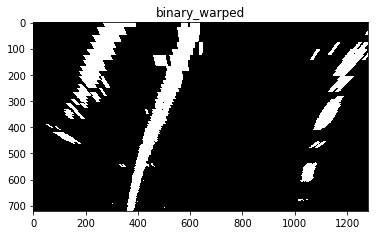

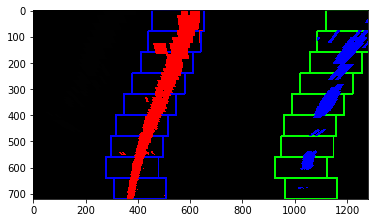

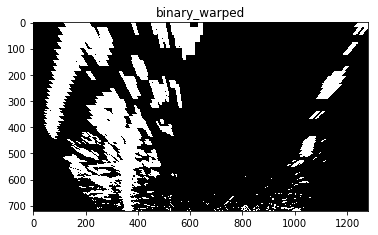

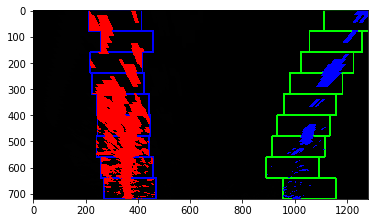

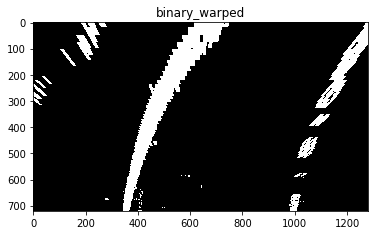

...

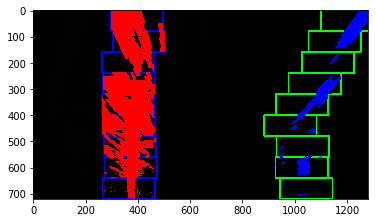

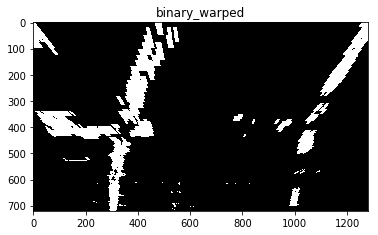

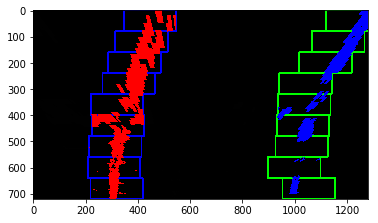

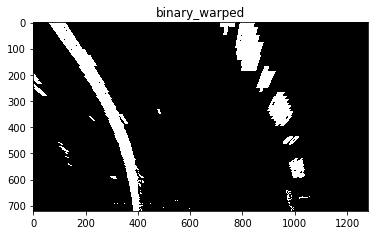

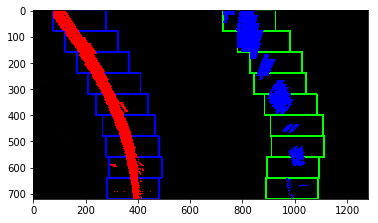

In [11]:

images = glob.glob('../test_images/warped_roi/warped*.png')
left_line=Line()
right_line=Line()

for name in images:
    
    binary_warped=cv2.imread(name,cv2.IMREAD_UNCHANGED)
    plt.figure()
    plt.title('binary_warped')
    #print('values in binary_warped_img',set(binary_warped.reshape(-1)))
    plt.imshow(binary_warped,cmap='gray')
    out_img,left_polynomial,right_polynomial,weight_left,weight_right,left_fitx,right_fitx,ploty= fit_polynomial(binary_warped)
    ## left and right polynomial should be used for the stats
    # l_pos is the real position 
    l_curvature,l_pos,l_pol=left_line.calculate_curvature_and_position_and_newPoli(left_polynomial)
    r_curvature,r_pos,r_pol=right_line.calculate_curvature_and_position_and_newPoli(right_polynomial)
    checked=left_line.check_lines_position(l_pos,r_pos)
    if checked:
        print('left pos : %f  and left curvature: %f'%(l_pos,l_curvature))
        print('right pos : %f  and right curvature: %f'%(r_pos,r_curvature))
        ## left_polynomial is the pixel polynomial, l_pol is the metters one
        left_line.update_line(l_pol,l_curvature,ploty,left_fitx,left_polynomial)
        right_line.update_line(r_pol,r_curvature,ploty,right_fitx,right_polynomial)
    else: 
        left_line.bad_line()
        right_line.bad_line()
        # añadir todo lo malo

    print('line checked=',checked)
    print(left_line.pixels_polynomial)
    print('the length of the array', len(left_line.pixels_polynomial))
    print('the mean',np.mean(left_line.pixels_polynomial,axis=0))

    """
    
    checked=left_line.check_lines_position(l_pos,r_pos)
    print(checked)
    print('left',left_line.calculate_curvature_and_position_and_newPoli(left_polynomial))
    print('right',right_line.calculate_curvature_and_position_and_newPoli(right_polynomial))
    #print('weight',weight_left,weight_right)
    """
    plt.figure()
    plt.imshow(out_img)


# Bringing all together

In [14]:
def process_image(frame,mtx,dist):
    #INPUTS frame: the current frame
            # transform_m,inverse_m: the perspective transformation matrices for the bird eye transform
            # mtx: transformation for the undistiortion process
            # dist: distortion coefficients
    #OUTPUTS
            # out_img: bir eye img with the rectangles
            # left_polynomial,right polynomial: coefficients of the fitted lines in pixels
            # weight_left,weight_right: number of pixels defining each line
            # left_fitx,right_fitx,ploty, pixel defining the continuous fitted lines
    new_frame=frame.copy()
    undist = cv2.undistort(frame, mtx, dist,None,mtx)
    (h,w,_)=np.shape(undist)
    ## definning for the warp
    bottom_y_percentage=0.935
    top_y_percentage=0.62
    width_x_top=0.06
    width_x_bottom=0.60
    offset=0.25*w
    src_points= np.float32([[w*(0.5-width_x_bottom/2),bottom_y_percentage*h],[w*(0.5+width_x_bottom/2),bottom_y_percentage*h],[w*(0.5+width_x_top/2),top_y_percentage*h],[w*(0.5-width_x_top/2),top_y_percentage*h]])
    dst_points= np.float32([[offset,h],[w-offset,h],[w-offset,0],[offset,0]])
    transform_matrix = cv2.getPerspectiveTransform(src_points, dst_points)
    inverse_transform_matrix = cv2.getPerspectiveTransform(dst_points,src_points)

    # defining vertices for the roi
    top_width_roi=0.15
    width_roi_bottom=0.76
    vertices= np.int32([[[w*(0.5-width_roi_bottom/2),bottom_y_percentage*h],[w*(0.5+width_roi_bottom/2),bottom_y_percentage*h],[w*(0.5+top_width_roi/2),top_y_percentage*h],[w*(0.5-top_width_roi/2),top_y_percentage*h]]])
    
    # executing the pipeline
    thresholded=pipeline(undist)
    roid=region_of_interest(thresholded, vertices)
    
    #warping the image
    warped_roid = cv2.warpPerspective(roid, transform_matrix, (w,h), flags=cv2.INTER_LINEAR)
    
    # fitting the line
    out_img,left_polynomial,right_polynomial,weight_left,weight_right,left_fitx,right_fitx,ploty= fit_polynomial(warped_roid)


    
    

    return out_img,left_polynomial,right_polynomial,weight_left,weight_right,left_fitx,right_fitx,ploty,inverse_transform_matrix,undist
    

['../test_images/test3.jpg', '../test_images/test5.jpg', '../test_images/test1.jpg', '../test_images/test2.jpg', '../test_images/test6.jpg', '../test_images/test4.jpg']


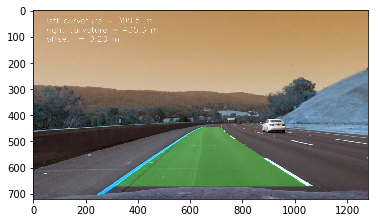

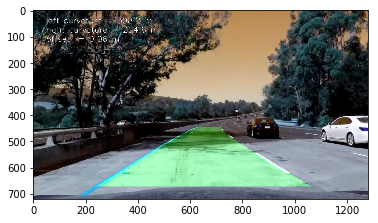

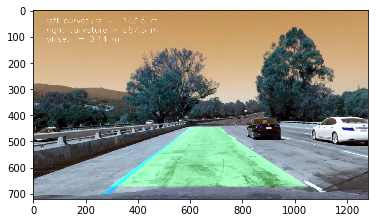

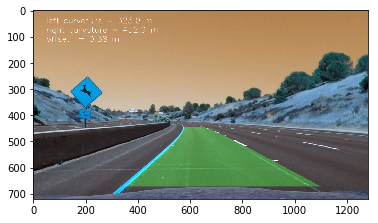

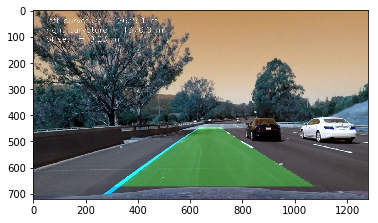

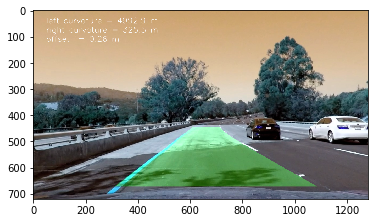

In [17]:
images = glob.glob('../test_images/test*.jpg')
print(images)
left_line=Line()
right_line=Line()
contador=0
for name in images:
    frame=cv2.imread(name)
    out_img,left_polynomial,right_polynomial,weight_left,weight_right,left_fitx,right_fitx,ploty,inverse_transform_matrix,undist= process_image(frame,mtx,dist)
    l_curvature,l_pos,l_pol=left_line.calculate_curvature_and_position_and_newPoli(left_polynomial)
    r_curvature,r_pos,r_pol=right_line.calculate_curvature_and_position_and_newPoli(right_polynomial)
    checked=left_line.check_lines_position(l_pos,r_pos)
    if checked:
        left_line.update_line(l_pol,l_curvature,ploty,left_fitx,left_polynomial)
        right_line.update_line(r_pol,r_curvature,ploty,right_fitx,right_polynomial)
    else: 
        left_line.bad_line()
        right_line.bad_line()
    # ploting the line
    warp_zero = np.zeros((frame.shape[0], frame.shape[1])).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    pts_left = np.array([np.transpose(np.vstack([left_line.allx, left_line.ally]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_line.allx, right_line.ally])))])
    pts = np.hstack((pts_left, pts_right))
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, inverse_transform_matrix, (frame.shape[1], frame.shape[0])) 

    # Combine the result with the original image
    ## mejor undist en lugar de frame
    result = cv2.addWeighted(undist, 1, newwarp, 0.3, 0)
    if checked:
        delta=left_line.get_position_delta(l_pos,r_pos)
        cv2.putText(result,  'offset  = %.2f m'%delta, (50,120), 0, 1, (255,255,255), 1, cv2.LINE_AA)
    cv2.putText(result,  'left curvature = %.1f m'%l_curvature, (50,50), 0, 1, (255,255,255), 1, cv2.LINE_AA)
    cv2.putText(result,  'right curvature = %.1f m'%r_curvature, (50,85), 0, 1, (255,255,255), 1, cv2.LINE_AA)
    plt.figure()
    plt.imshow(result)

    cv2.imwrite('../safe_region/safe%i.png'%contador,result)
    contador+=1


In [18]:
#print("the number of bad lines is %i" %left_line.cont_bad)
#print("the x values of the last %s" %left_line.recent_xfitted)
#print("the recent xfitted are are %s" %left_line.recent_polynomials)
## line.recent_polynomials is 
#print("allx,ally",left_line.ally,left_line.allx)

## for the fl_image

In [19]:
import time
class ProcessImage:
    ## THE FUNCTION IS ABLE TO PROCESS 5 frames per second if process_image is called every frame
    
    ## IT would be faster if
    def __init__(self, mtx, dist):
        self.left_line = Line()
        self.right_line = Line()
        self.mtx=mtx
        self.dist=dist
        print('adding text hola')
    def __call__(self, frame):
        frame=frame[:,:,::-1]
        out_img,left_polynomial,right_polynomial,weight_left,weight_right,left_fitx,right_fitx,ploty,inverse_transform_matrix,undist = process_image(frame,self.mtx,self.dist)
        l_curvature,l_pos,l_pol=self.left_line.calculate_curvature_and_position_and_newPoli(left_polynomial)
        r_curvature,r_pos,r_pol=self.right_line.calculate_curvature_and_position_and_newPoli(right_polynomial)
        checked=self.left_line.check_lines_position(l_pos,r_pos)
        if checked:
            self.left_line.update_line(l_pol,l_curvature,ploty,left_fitx,left_polynomial)
            self.right_line.update_line(r_pol,r_curvature,ploty,right_fitx,right_polynomial)
        else: 
            self.left_line.bad_line()
            self.right_line.bad_line()
        # ploting the line
        warp_zero = np.zeros((frame.shape[0], frame.shape[1])).astype(np.uint8)
        color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
        pts_left = np.array([np.transpose(np.vstack([self.left_line.allx, self.left_line.ally]))])
        pts_right = np.array([np.flipud(np.transpose(np.vstack([self.right_line.allx, self.right_line.ally])))])
        pts = np.hstack((pts_left, pts_right))
        #cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))
        if self.left_line.averaged:
            pts_left2 = np.array([np.transpose(np.vstack([self.left_line.allx, self.left_line.ally]))])
            pts_right2 = np.array([np.flipud(np.transpose(np.vstack([self.right_line.averaged_x, self.right_line.ally])))])
            pts2 = np.hstack((pts_left2, pts_right2))
            #cv2.fillPoly(color_warp, np.int_([pts2]), (0,0, 255))
            pts_left3 = np.array([np.transpose(np.vstack([self.left_line.allx, self.left_line.ally]))])
            pts_right3 = np.array([np.flipud(np.transpose(np.vstack([self.right_line.median_x, self.right_line.ally])))])
            pts3 = np.hstack((pts_left3, pts_right3))
            cv2.fillPoly(color_warp, np.int_([pts3]), (0,255, 0))
        # Warp the blank back to original image space using inverse perspective matrix (Minv)
        newwarp = cv2.warpPerspective(color_warp, inverse_transform_matrix, (frame.shape[1], frame.shape[0])) 

        # Combine the result with the original image
        ## mejor undist en lugar de frame
        #cv2.line(frame,(0,0),(200,300),(255,255,255),50)
        #plt.figure()
        #plt.imshow(frame)

        result = cv2.addWeighted(undist, 1, newwarp, 0.3, 0)
        if checked:
            delta=left_line.get_position_delta(l_pos,r_pos)
            cv2.putText(result,  'offset  = %.2f m'%delta, (50,120), 0, 1, (255,255,255), 1, cv2.LINE_AA)
        cv2.putText(result,  'left curvature = %.1f m'%l_curvature, (50,50), 0, 1, (255,255,255), 1, cv2.LINE_AA)
        cv2.putText(result,  'right curvature = %.1f m'%r_curvature, (50,85), 0, 1, (255,255,255), 1, cv2.LINE_AA)
        # an EMA exponentially moving average will be a good idea 
        #exponentially weighted moving average
        ## result must be in rgb
        result=result[:,:,::-1]
        new_result = np.zeros((frame.shape[0]+out_img.shape[0],frame.shape[1],3),dtype=np.uint8)
        new_result[:frame.shape[0],:frame.shape[1],:]=result
        new_result[frame.shape[0]:,:out_img.shape[1],:]=out_img
        
        #result = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)


        return result

In [20]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML
white_output = '../output_video_full_pipeline_reviewed.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
##clip1 = VideoFileClip("test_videos/solidWhiteRight.mp4").subclip(0,5)

## change clip number and white output name to get the changes in curvature

clip40 = VideoFileClip("../project_video.mp4")#.subclip(17,28) # hasta 30 se puede observar el error #project_video.mp4
white_clip = clip40.fl_image(ProcessImage(mtx,dist)) #NOTE: this function receives an RGB image color image
%time white_clip.write_videofile(white_output, audio=False)

adding text hola
[MoviePy] >>>> Building video ../output_video_full_pipeline_reviewed.mp4
[MoviePy] Writing video ../output_video_full_pipeline_reviewed.mp4


100%|█████████▉| 1260/1261 [06:20<00:00,  3.29it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: ../output_video_full_pipeline_reviewed.mp4 

CPU times: user 4min 6s, sys: 2.87 s, total: 4min 9s
Wall time: 6min 23s


In [21]:

HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(white_output))